# EXPLORATIVE ANALYSIS

In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import os
import re

# import functions from vis
import vis


# lcz dictionary
lcz_dict = {'A': {'Name': 'Dense trees', 'groups': ['Land Cover']},
        'B': {'Name': 'Scattered trees', 'groups': ['Land Cover']},
        'C': {'Name': 'Bush, scrub', 'groups': ['Land Cover']},
        'D': {'Name': 'Low plants', 'groups': ['Land Cover']},
        'E': {'Name': 'Bare rock or paved', 'groups': ['Land Cover']},
        'F': {'Name': 'Bare soil or sand', 'groups': ['Land Cover']},
        'G': {'Name': 'Water', 'groups': ['Land Cover']},
        '1': {'Name': 'Compact high-rise', 'groups': ['Compact', 'Compact and Industry', 'High-rise']},
        '2': {'Name': 'Compact mid-rise', 'groups': ['Compact', 'Compact and Industry', 'Mid-rise']},
        '3': {'Name': 'Compact low-rise', 'groups': ['Compact', 'Compact and Industry', 'Low-rise']},
        '4': {'Name': 'Open high-rise', 'groups': ['Open', 'High-rise']},
        '5': {'Name': 'Open mid-rise', 'groups': ['Open', 'Mid-rise']},
        '6': {'Name': 'Open low-rise', 'groups': ['Open', 'Low-rise']},
        '7': {'Name': 'Lightweight low-rise', 'groups': ['Lightweight and Sparse', 'Low-rise', 'Lightweight']},
        '8': {'Name': 'Large low-rise', 'groups': ['Lightweight and Sparse', 'Low-rise', 'Lightweight']},
        '9': {'Name': 'Sparsely built', 'groups': ['Lightweight and Sparse', 'Low-rise']},
        '10': {'Name': 'Heavy industry', 'groups': ['Compact and Industry', 'Low-rise']}}

# features
features = ['altitude', 'buildings', 'forests', 'pavedsurfaces', 'surfacewater', 'urbangreen', 'humidity', 'irradiation']

Gather all station summary files, create a list of all unique station identifiers and create a dictionary for each station with the errors from all dropset runs

In [2]:
paths = [f'S:/pools/t/T-IDP-Projekte-u-Vorlesungen/Meteoblue/QRF/Data/QRF_Dropset/run_{i}' for i in range(1, 6)]
station_summaries, station_errors, stations = vis.station_data(paths)

For each run, perform the LCZ analysis consisting of 3 parts: 

1. Determine LCZ types present in the dropset and identify those not covered
2. Visualise stations per LCZ type
3. Visualsie RMSE and SD per LCZ type

Run 1:
	available: ['5', '9', '6', 'A', '2', '8', '3']
	unavailable: {'E', 'F', '1', 'G', '7', 'D', '10', 'C', 'B', '4'}
Run 2:
	available: ['2', '5', '9', '6', 'A', '1', 'D', '4', '8', '3', 'G']
	unavailable: {'E', 'F', '7', '10', 'C', 'B'}
Run 3:
	available: ['5', '2', '9', 'A', '6', 'G', '1', '8', 'D', '3', '4']
	unavailable: {'E', 'F', '7', '10', 'C', 'B'}
Run 4:
	available: ['2', '5', '9', '6', 'A', '1', 'D', 'G', '4', '8', '3']
	unavailable: {'E', 'F', '7', '10', 'C', 'B'}
Run 5:
	available: ['2', '5', '9', '6', 'A', '1', 'D', 'G', '4', '8', '3']
	unavailable: {'E', 'F', '7', '10', 'C', 'B'}


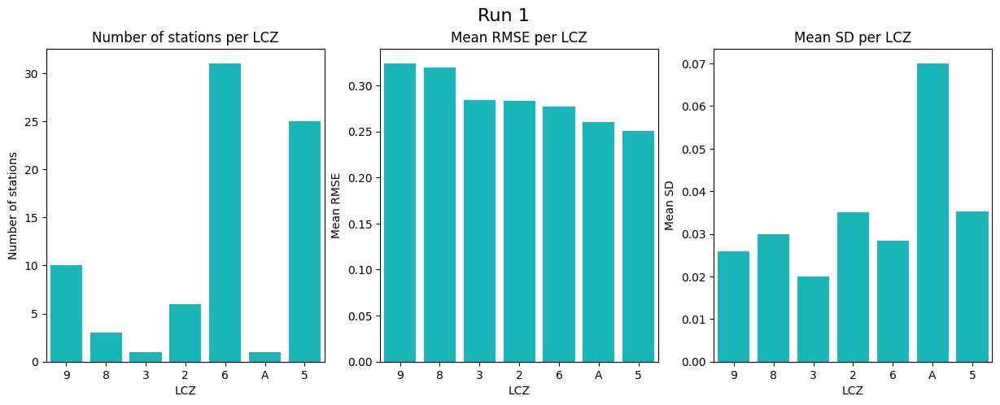

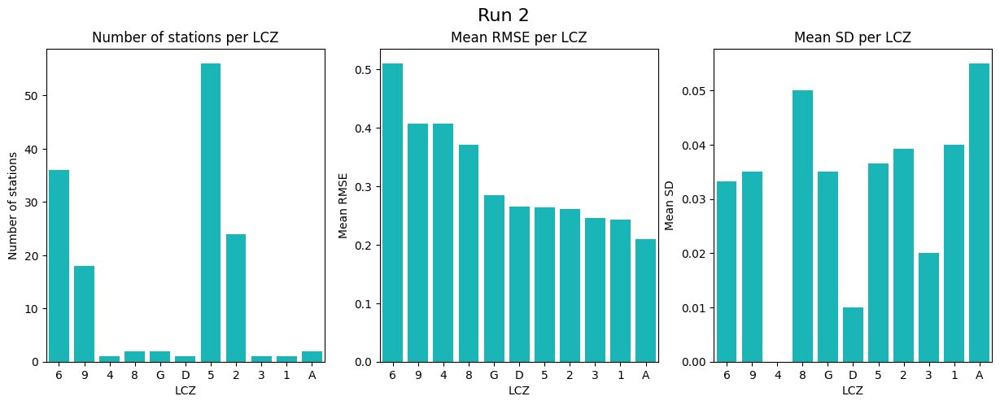

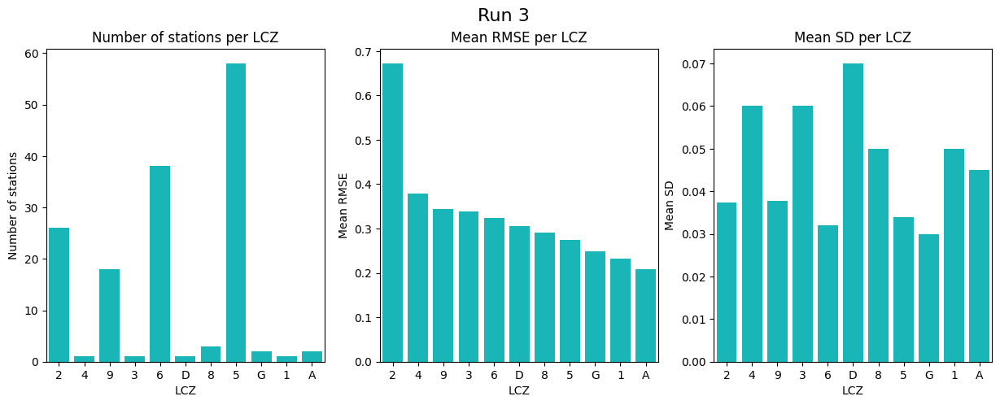

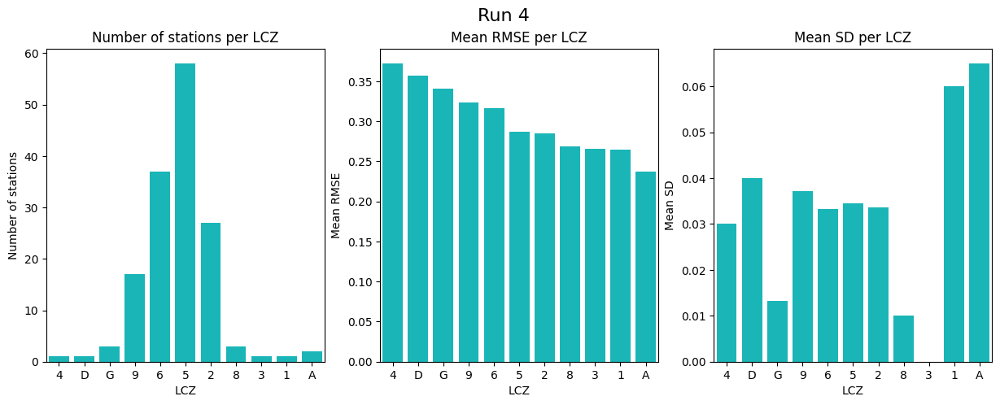

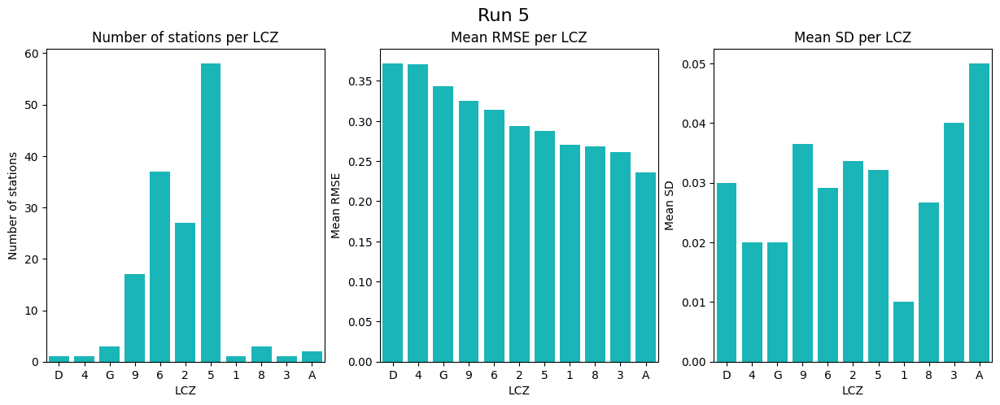

In [3]:
vis.lcz_stat_graphs(station_summaries,lcz_dict, paths)

Gather all errors, predicted and true temperatuers as well as the LCZ classification and station ID into one dataframe, which allows for a variety of analyses.

In [4]:
lcz_df = vis.lcz_data(stations, station_errors, lcz_dict, paths)

First we analyse the number of stations per LCZ and subsequently the distribution of errors accross the LCZs. We notice here that the LCZs 2 and 6, corresponding to _compact mid-rise_ and _open low-rise_ have a large spread. 

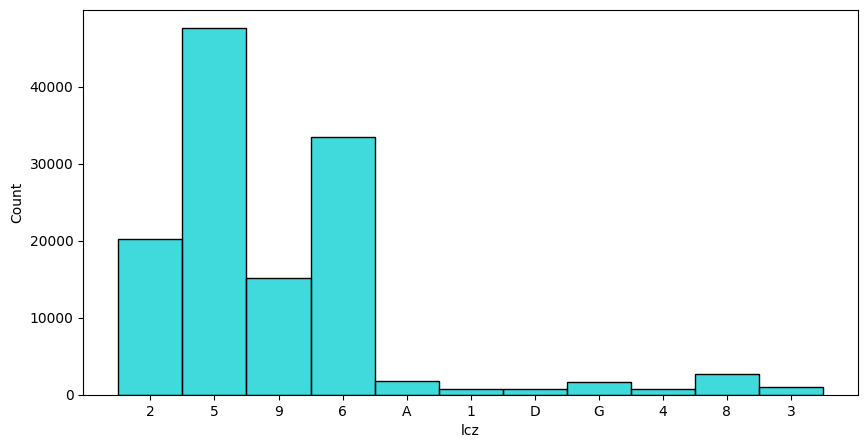

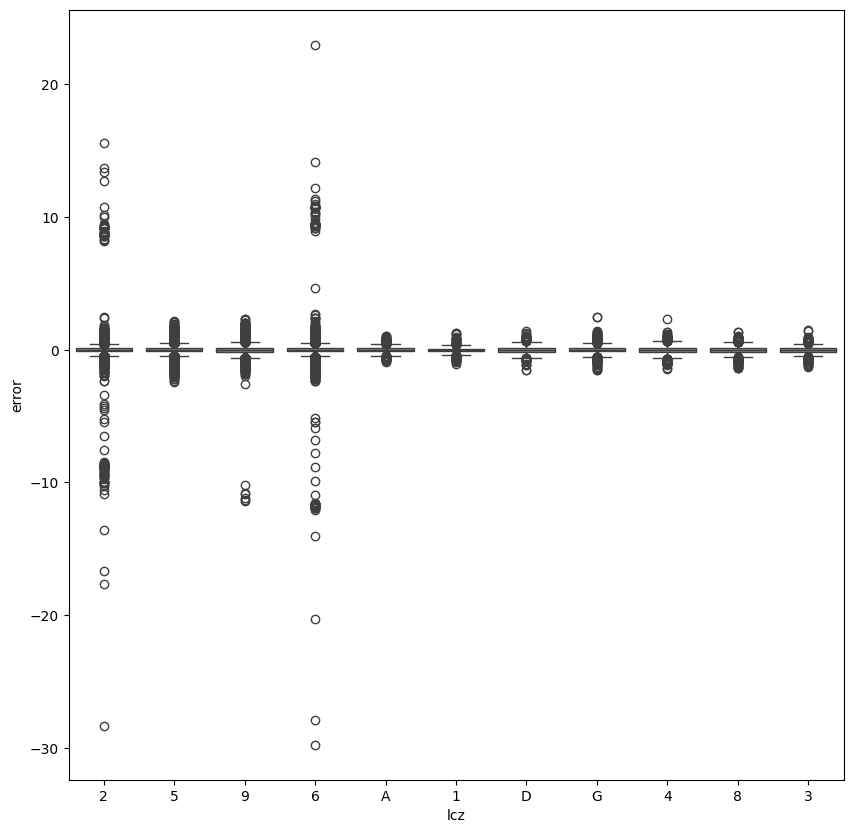

In [5]:
# barplot of stations per LCZ over all runs
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.histplot(x='lcz', data=lcz_df, color='darkturquoise')
# boxplot of error distribution by LCZ
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.boxplot(x='lcz', y='error', data=lcz_df, color='darkturquoise')

We remove these two LCZs and notice a third LCZ with a series of observations significantly beyond the more common [-2, 2] error spread of the other stations. These observations seem to be far outside of the standard error spread. 

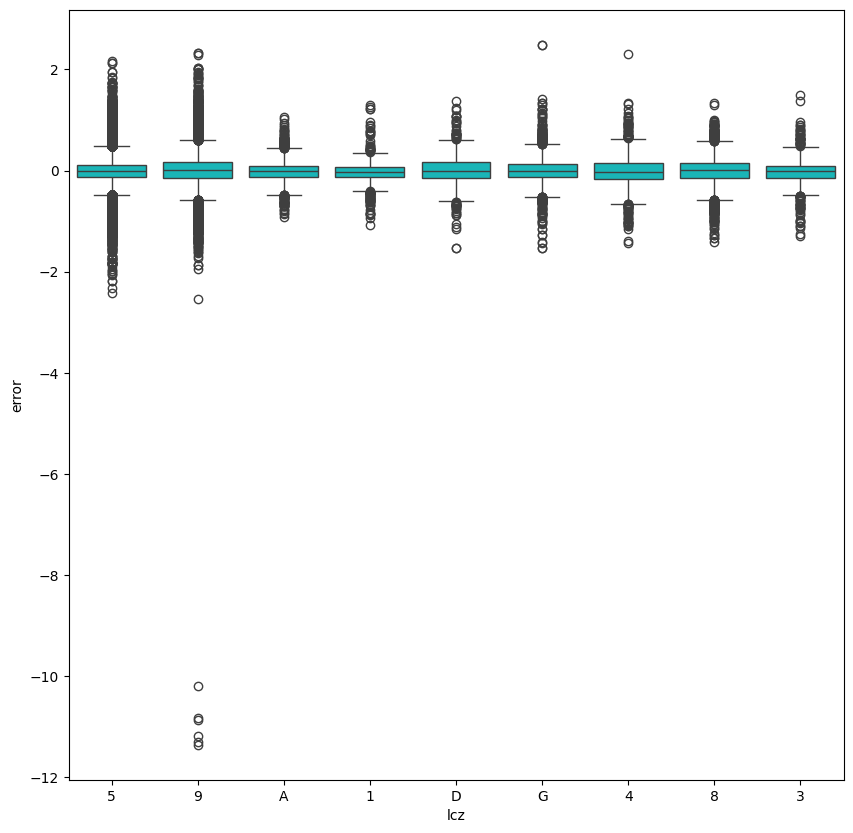

In [6]:
# plot of error distribution by LCZ without LCZs 2 and 6
df = lcz_df[lcz_df['lcz'] != '2']
df = df[df['lcz'] != '6']
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.boxplot(x='lcz', y='error', data=df, color='darkturquoise')

Next, we clean the data for all observations (i.e., errors) which do not fall within 3 standard deviations of the data (99.7%), meaning that we remove the outer 0.3% of the data. 

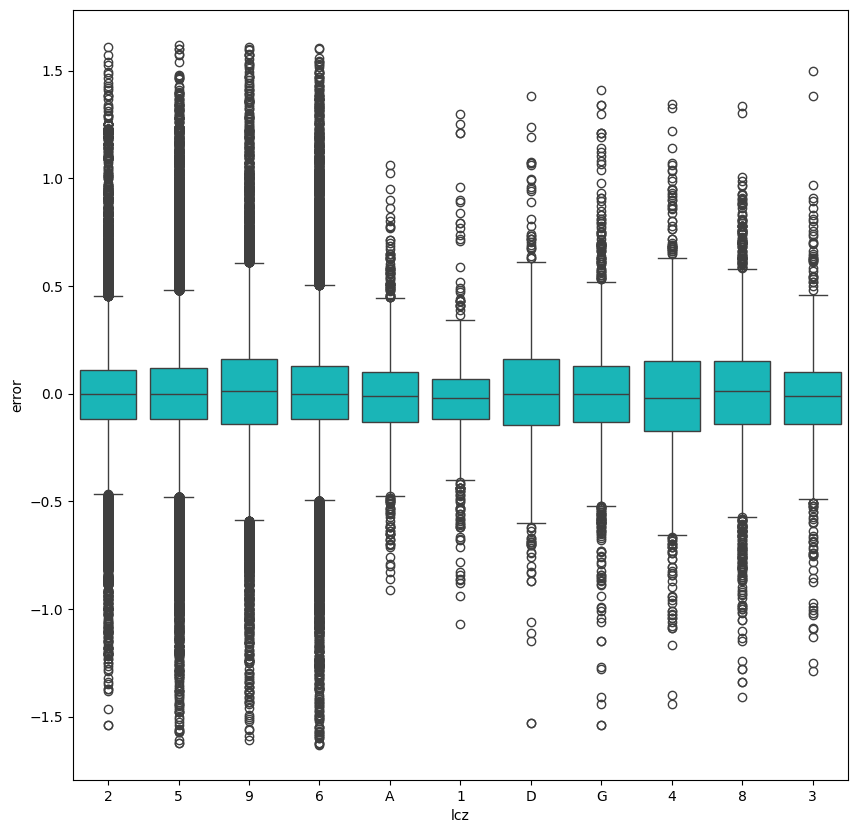

In [7]:
import qrf_utils
lcz_cleaned, lcz_outliers = qrf_utils.pop_outliers_std(lcz_df, 'error', 3)
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.boxplot(x='lcz', y='error', data=lcz_cleaned, color='darkturquoise')

Note that the LCZs 2, 6 and 9 are no longer as noticeable now that distant outliers have been removed. 

Given that 0.5°C is our benchmark (set by our sensors), we want to analyse the observations which fall outside of this range in more detail. While the majority of our observations adhere to this limitation, there are possible correlations between higher errors, LCZ, station and times.

In [8]:
outliers = lcz_df[lcz_df['error'].apply(lambda x: abs(x)) > 0.5]
print('Percentage of observations outside of measurement accuracy: ', round((len(outliers)/len(lcz_df)) * 100, 2))

Percentage of observations outside of measurement accuracy:  9.23


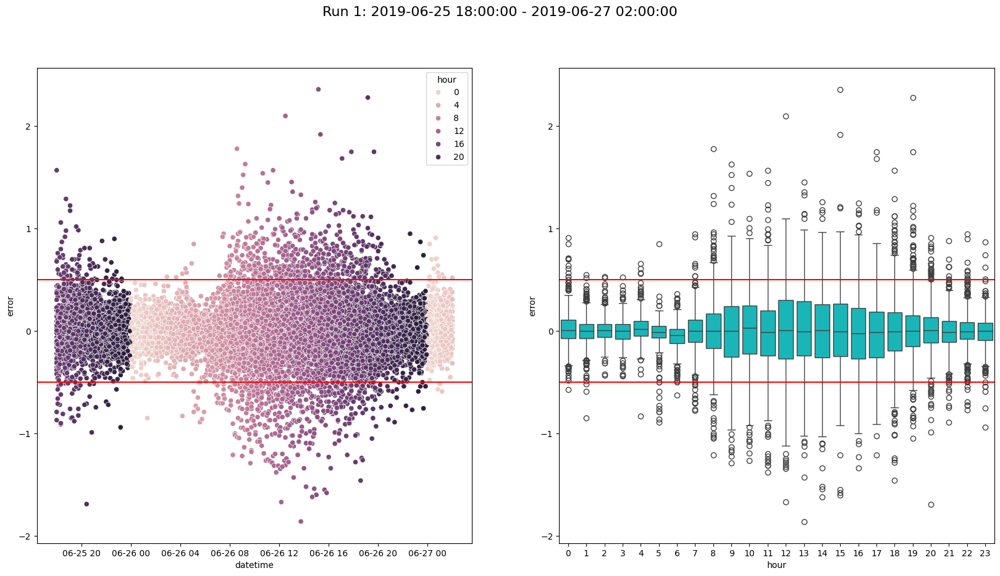

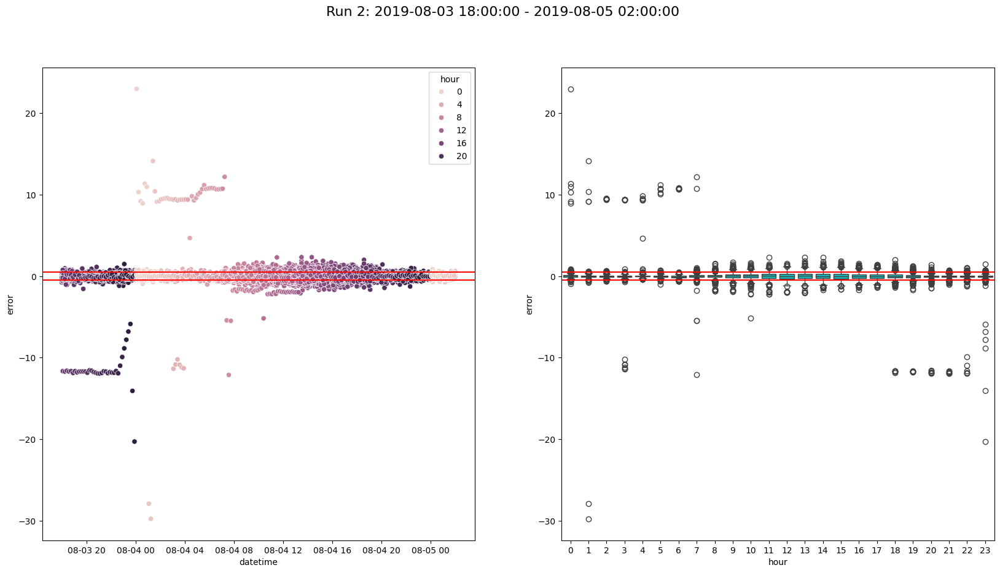

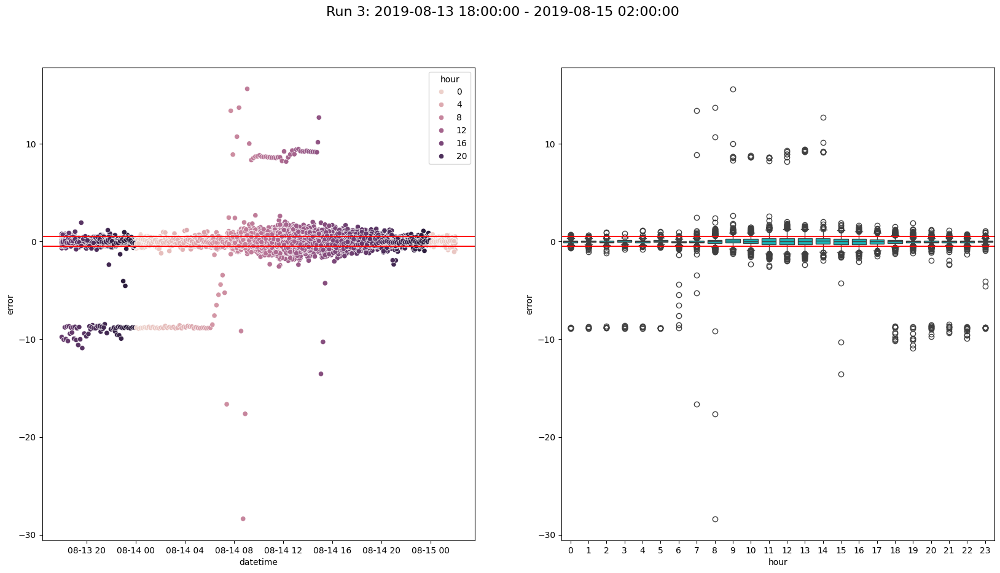

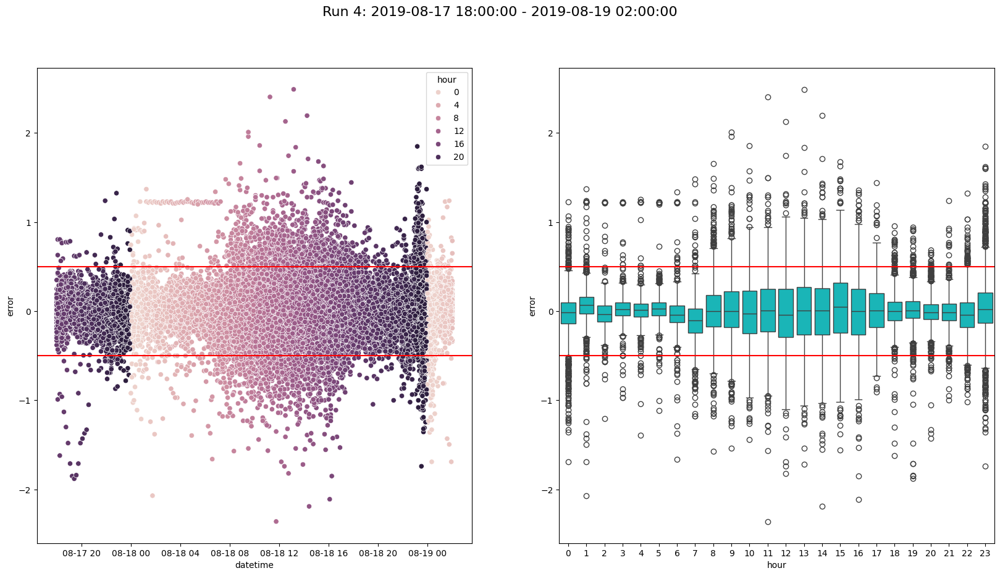

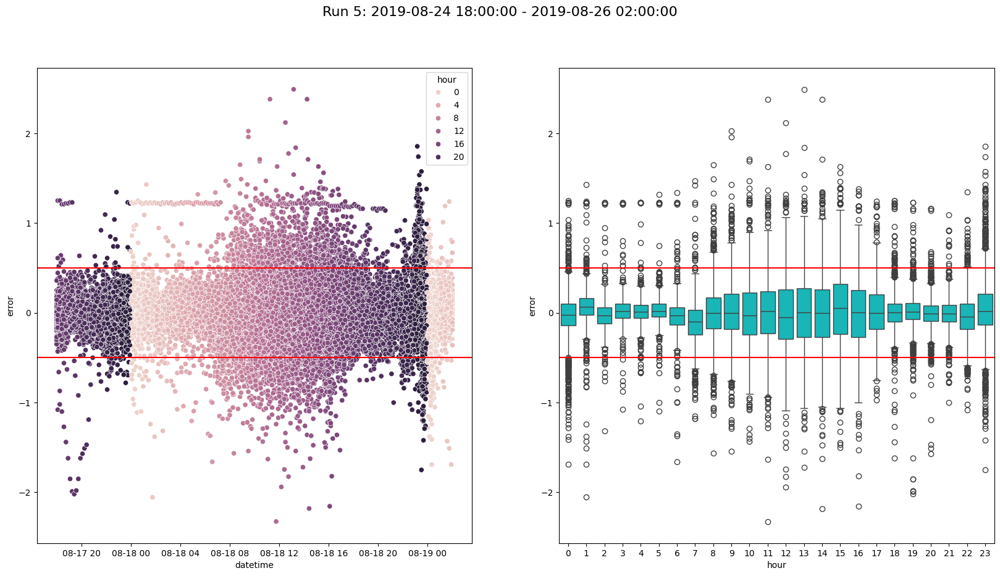

In [9]:
# scatter and boxplot of error distribution by run and time
vis.by_run_and_time(lcz_df)

In [10]:
lcz_df['run'].unique()  

array(['2', '3', '4', '5', '1'], dtype=object)

Same plots for cleaned data:

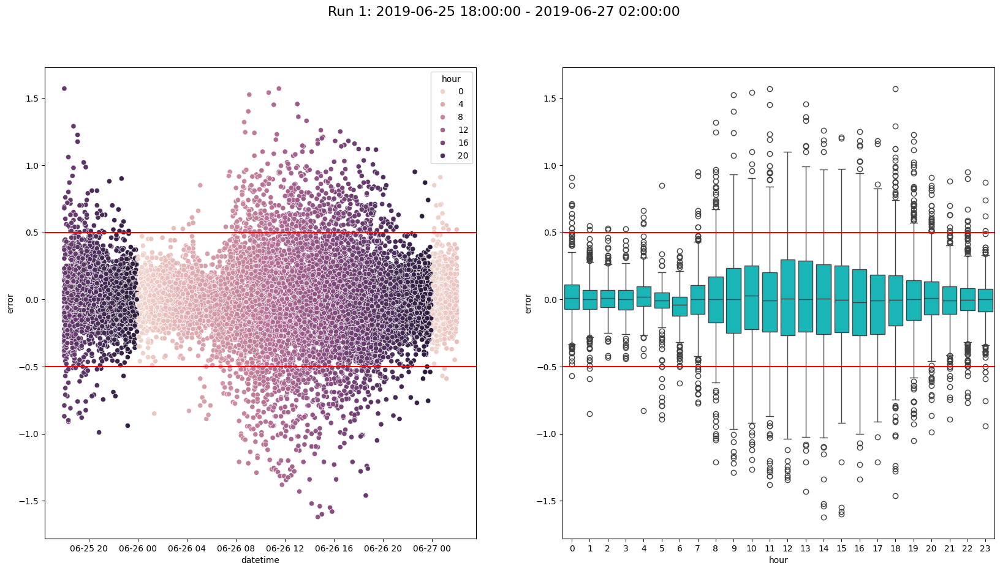

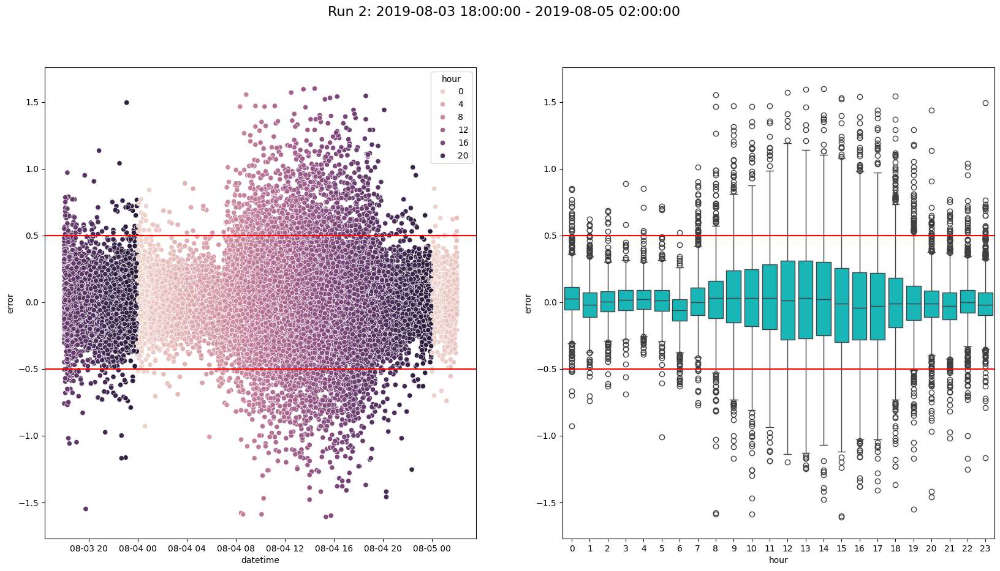

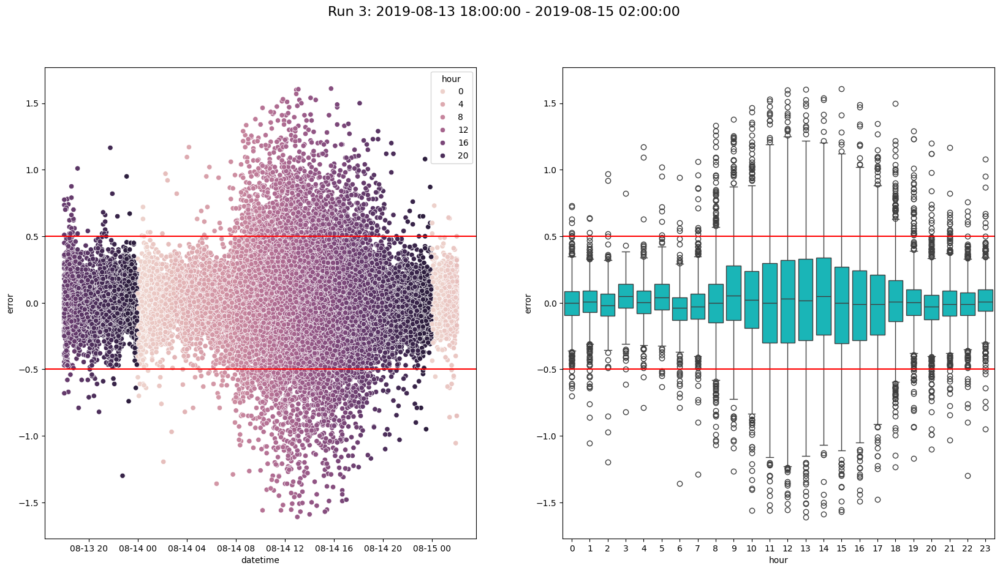

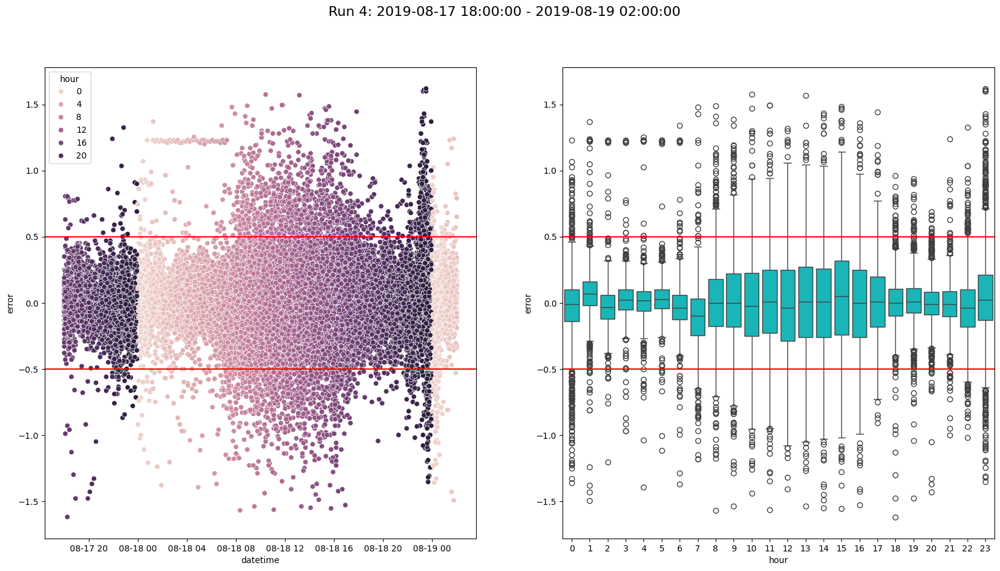

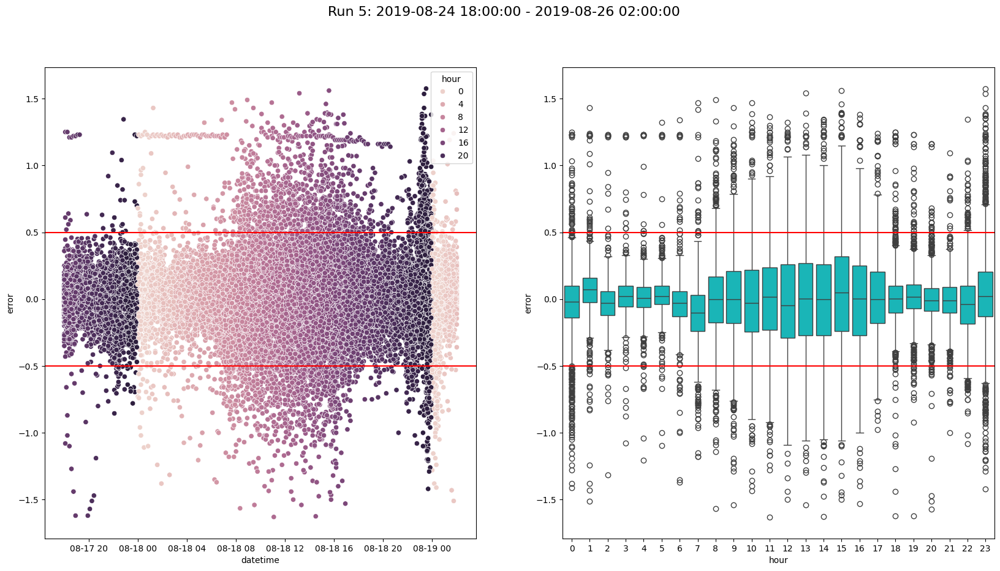

In [11]:
from importlib import reload
reload(vis)
vis.by_run_and_time(lcz_cleaned)

TODO: 
 - same plot by local climate zone, day light, night dark
 - assess correlation using error (LCZ classification correct?)
 - station vs. station correlation analysis (table)


These graphs show that the majority of errors lie within [-1.5°, 1.5°], with evidence that daytime temperatures are harder to predict that nighttime temperatures. 
Run 1 shows the least spread, runs 4 and 5 have a series of errors which seem to form a horizontal pattern worth analysing. 

# Run 1

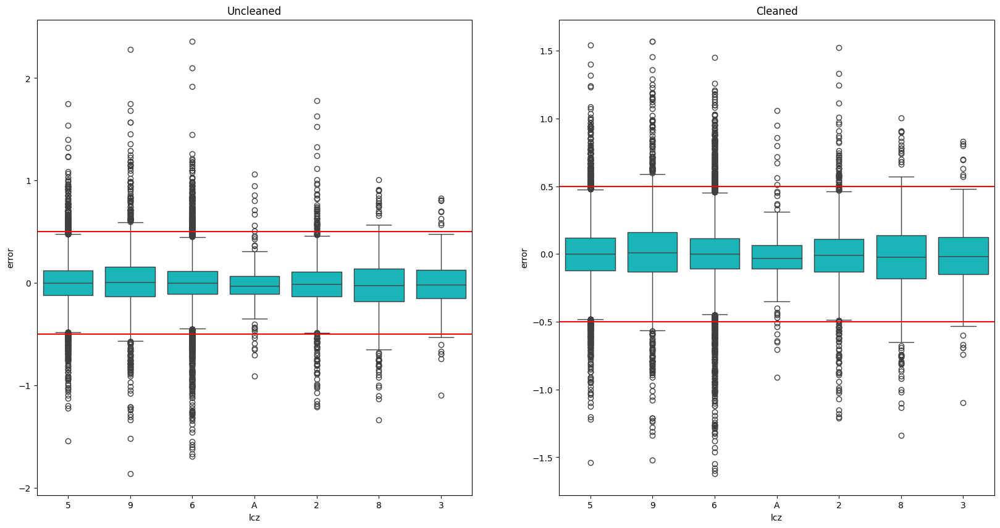

In [12]:
# Analysis of run 1
vis.run_boxplot(lcz_df, lcz_cleaned, '1')

Run 1 doesn't seem to need any specific outlier cleaning, as all the errors seem to move within similar bounds. 

# Run 2

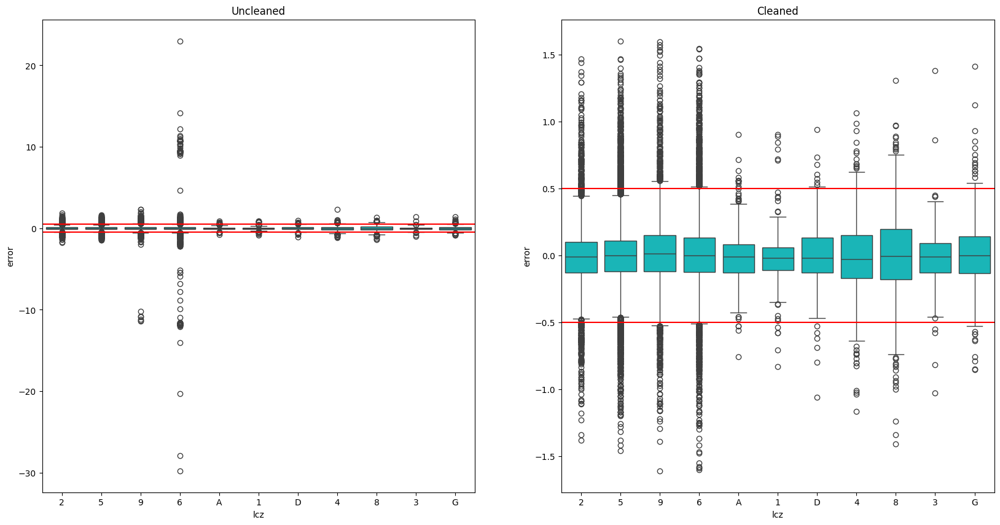

In [13]:
vis.run_boxplot(lcz_df, lcz_cleaned, '2')

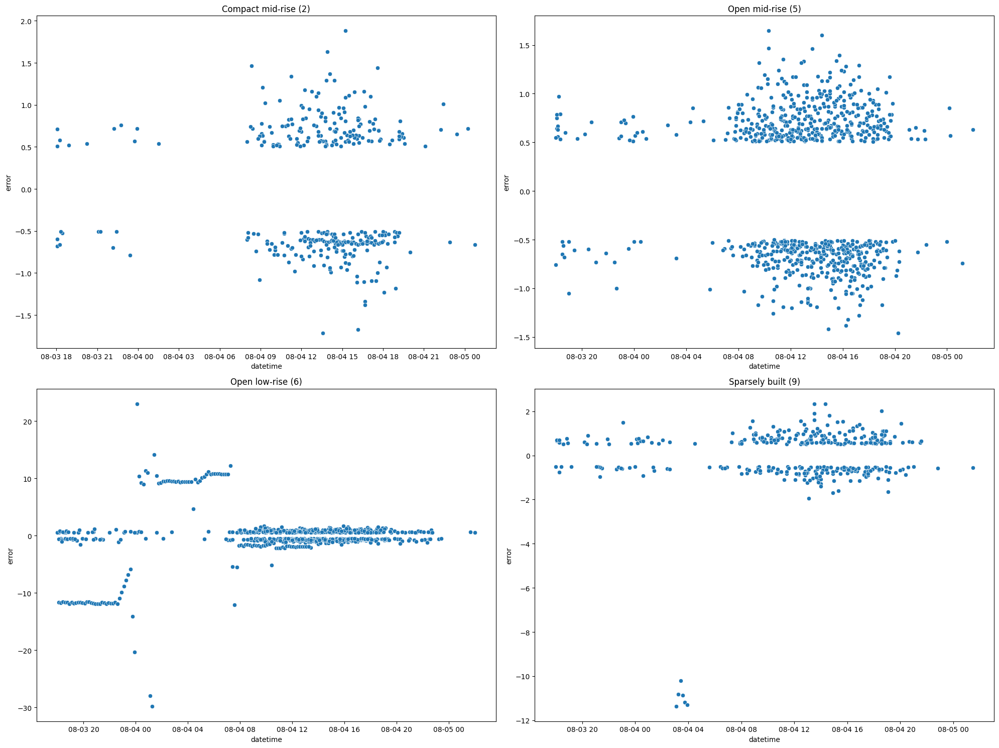

In [14]:
lczs_to_analyse = ['2', '5', '6', '9']
run_2_outliers = vis.run_lcz_scatterplot(outliers, lcz_dict, '2', lczs_to_analyse)

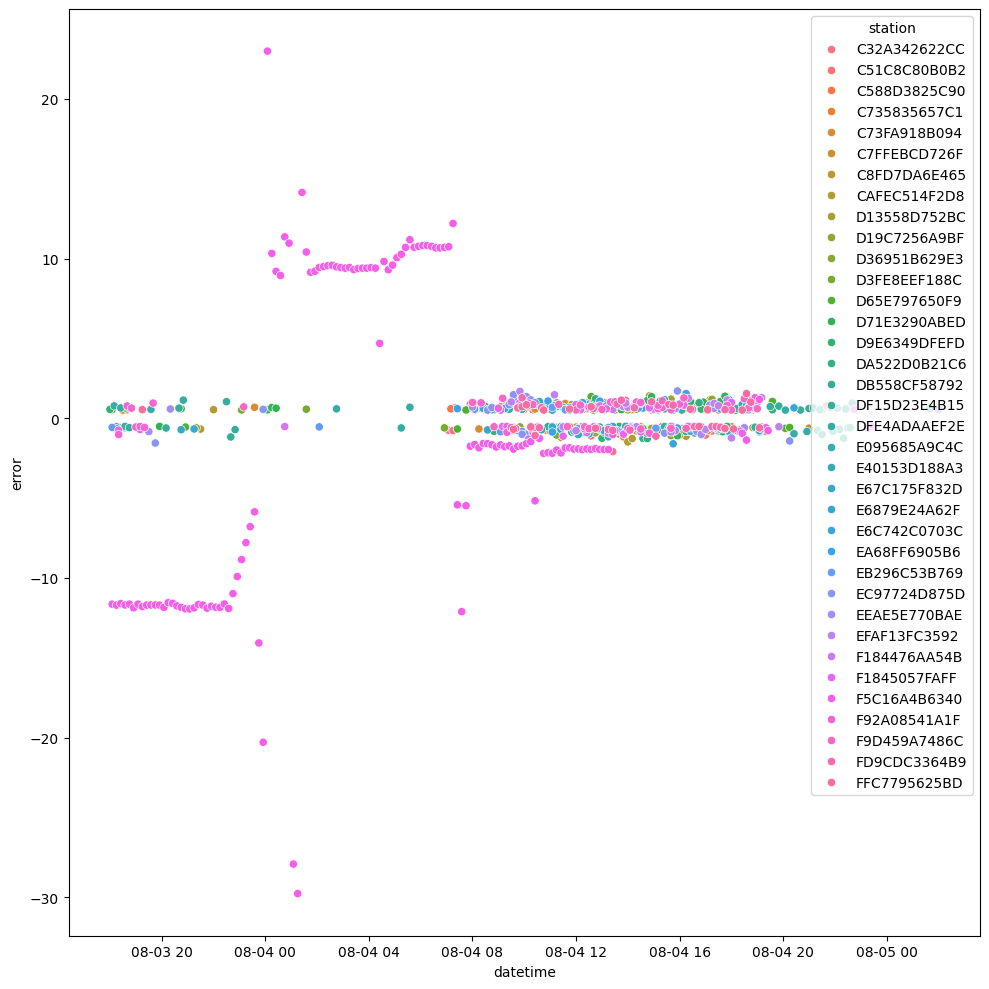

In [15]:
fig, axs = plt.subplots(figsize=(10, 10), tight_layout=True)
ax = sns.scatterplot(x='datetime', y='error', data=run_2_outliers[run_2_outliers['lcz'] == '6'], hue='station')

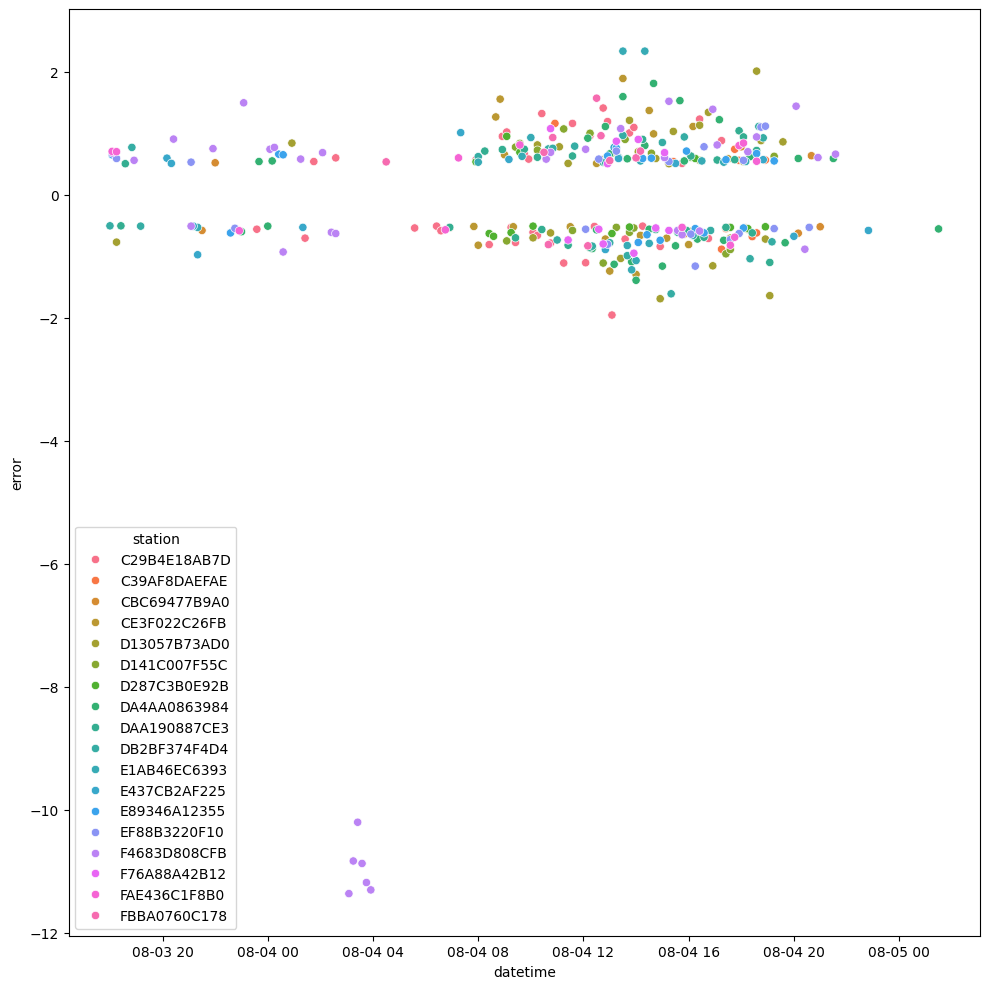

In [16]:
fig, axs = plt.subplots(figsize=(10, 10), tight_layout=True)
ax = sns.scatterplot(x='datetime', y='error', data=run_2_outliers[run_2_outliers['lcz'] == '9'], hue='station')

The station at fault in LCZ 6 is `F5C16A4B6340`, while station `F4683D808CFB` shows significant outliers in LCZ 9

Text(0.5, 1.0, 'Station F4683D808CFB error distribution over run 2')

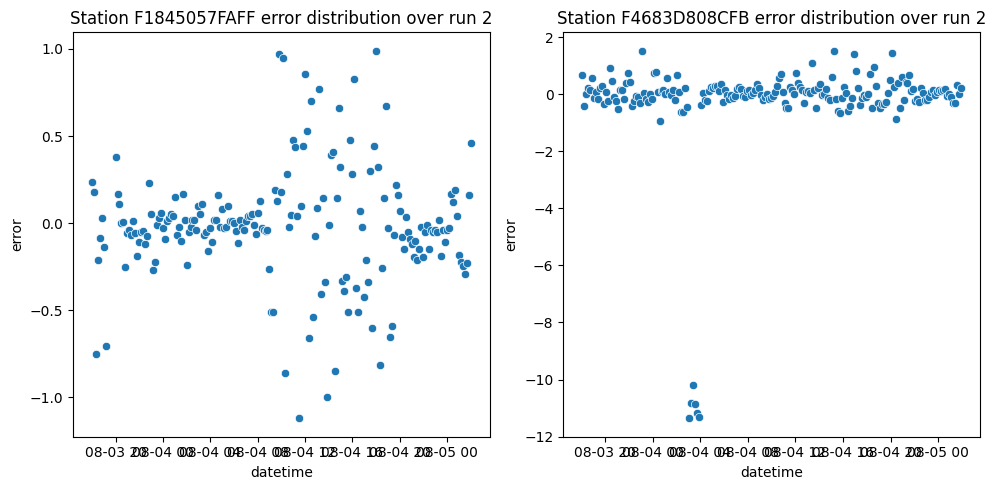

In [17]:
station_df = lcz_df[lcz_df['station'] == 'F1845057FAFF']
station_run_2 = station_df[station_df['run'] == '2']
fig, axs = plt.subplots(1, 2, figsize=(10, 5), tight_layout=True)
ax2 = sns.scatterplot(x='datetime', y='error', data=station_run_2, ax=axs[0])
ax2.set_title('Station F1845057FAFF error distribution over run 2')
station_df = lcz_df[lcz_df['station'] == 'F4683D808CFB']
station_run_2 = station_df[station_df['run'] == '2']
ax2 = sns.scatterplot(x='datetime', y='error', data=station_run_2, ax=axs[1])
ax2.set_title('Station F4683D808CFB error distribution over run 2')


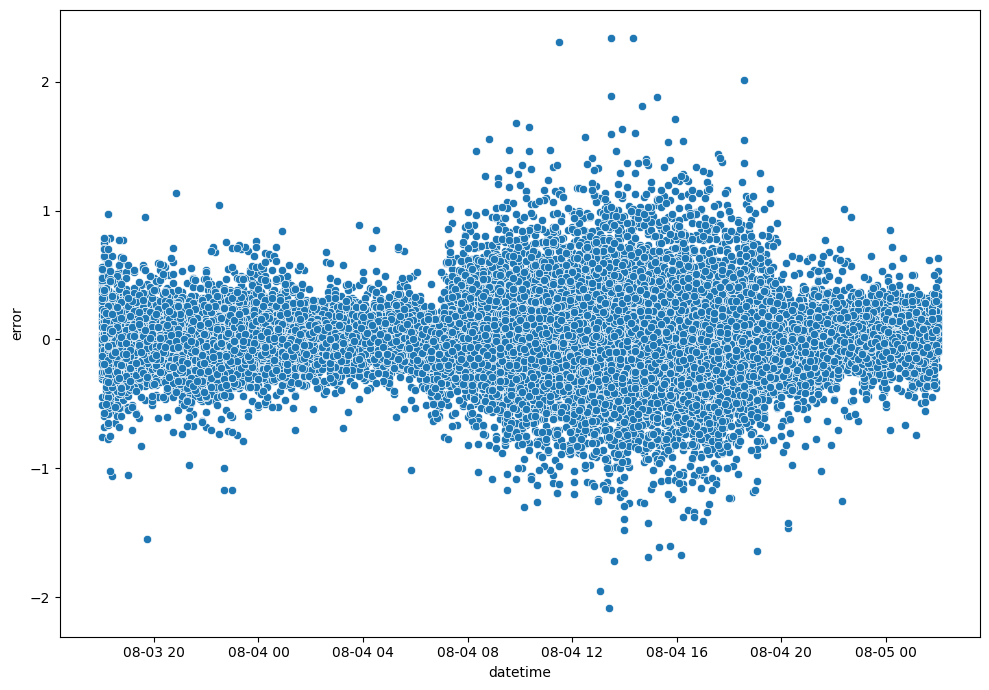

In [18]:
remove = [x not in ['F5C16A4B6340', 'F4683D808CFB'] for x in list(lcz_df['station'])]
lcz_df_removed_stations = lcz_df.iloc[remove]
lcz_df_removed_stations_2 = lcz_df_removed_stations[lcz_df_removed_stations['run'] == '2']
fig, axs = plt.subplots(figsize=(10, 7), tight_layout=True)
ax = sns.scatterplot(x='datetime', y='error', data=lcz_df_removed_stations_2)

# Run 3

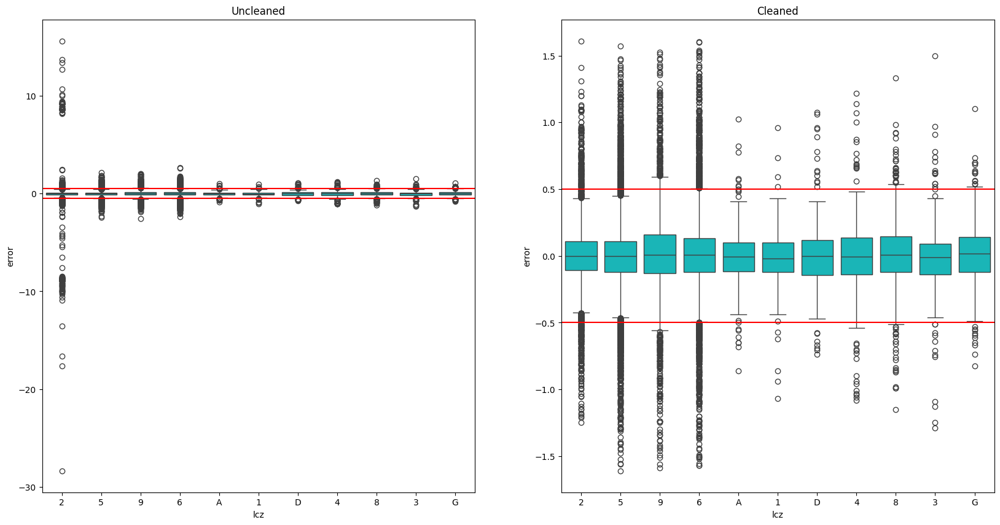

In [19]:
vis.run_boxplot(lcz_df, lcz_cleaned, '3')

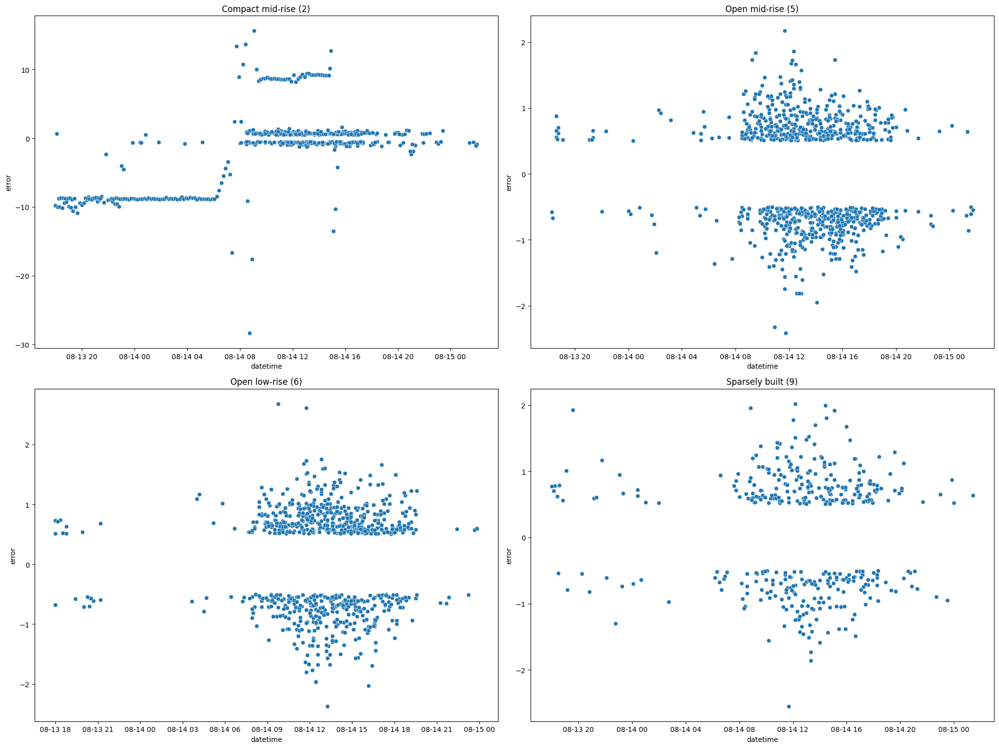

In [20]:
lczs_to_analyse = ['2', '5', '6', '9']
run_3_outliers = vis.run_lcz_scatterplot(outliers, lcz_dict, '3', lczs_to_analyse)

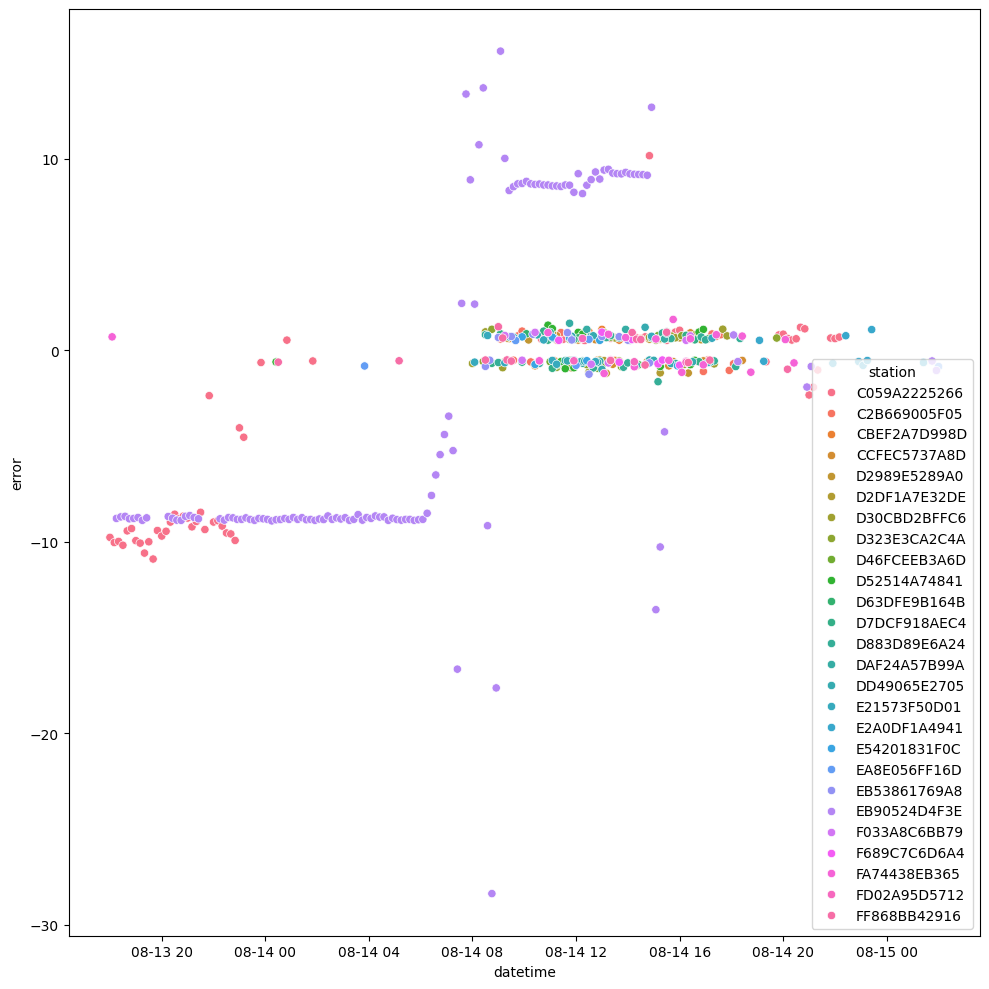

In [21]:
fig, axs = plt.subplots(figsize=(10, 10), tight_layout=True)
ax = sns.scatterplot(x='datetime', y='error', data=run_3_outliers[run_3_outliers['lcz'] == '2'], hue='station')

Two stations present significant errors: `EB90524D4F3E` and `C059A2225266`

Text(0.5, 1.0, 'Station C059A2225266 error distribution over run 3')

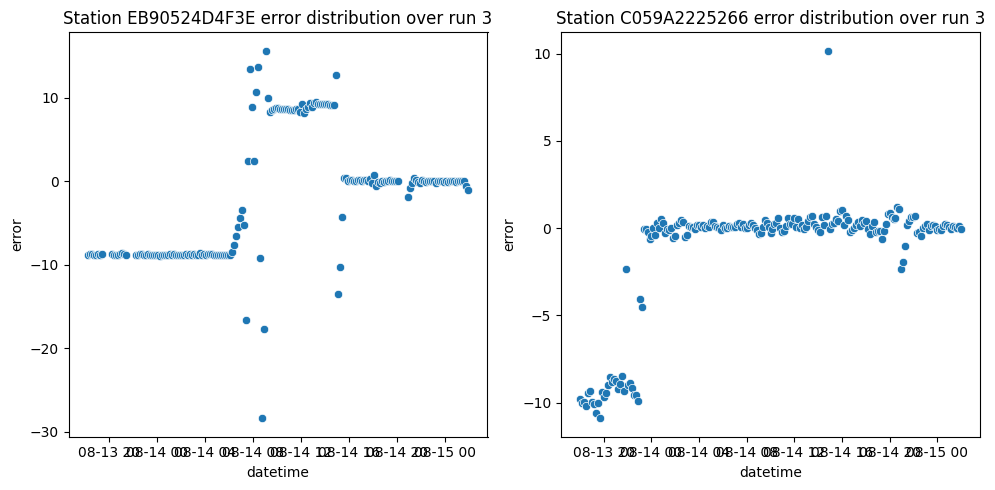

In [22]:
station_df = lcz_df[lcz_df['station'] == 'EB90524D4F3E']
station_run_3 = station_df[station_df['run'] == '3']
fig, axs = plt.subplots(1, 2, figsize=(10, 5), tight_layout=True)
ax2 = sns.scatterplot(x='datetime', y='error', data=station_run_3, ax=axs[0])
ax2.set_title('Station EB90524D4F3E error distribution over run 3')
station_df = lcz_df[lcz_df['station'] == 'C059A2225266']
station_run_3 = station_df[station_df['run'] == '3']
ax2 = sns.scatterplot(x='datetime', y='error', data=station_run_3, ax=axs[1])
ax2.set_title('Station C059A2225266 error distribution over run 3')

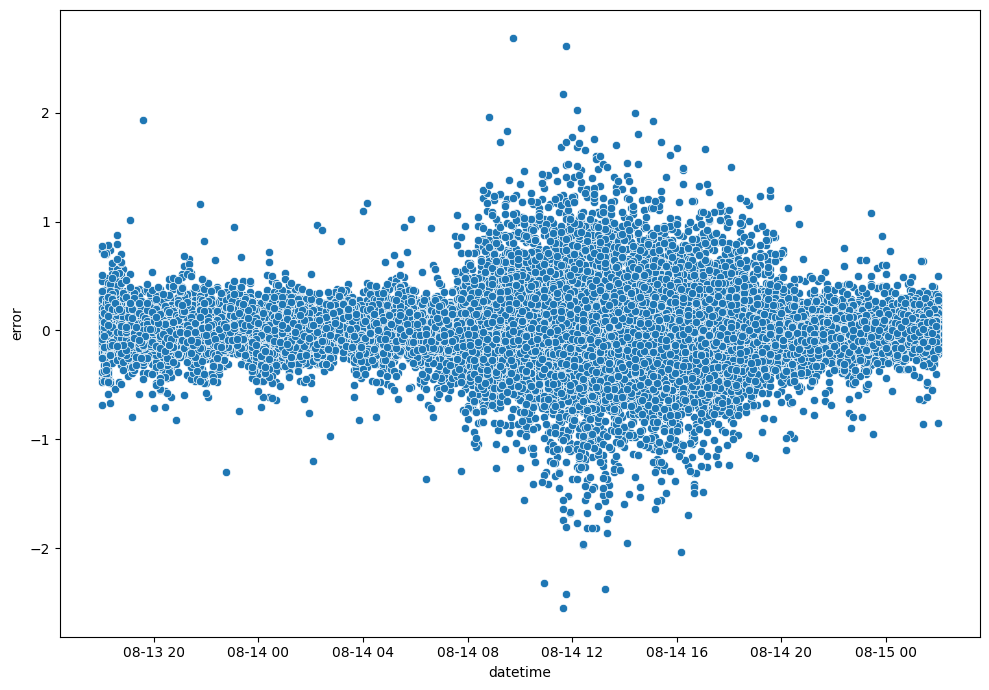

In [23]:
remove = [x not in ['EB90524D4F3E', 'C059A2225266'] for x in list(lcz_df['station'])]
lcz_df_removed_stations = lcz_df.iloc[remove]
lcz_df_removed_stations_3 = lcz_df_removed_stations[lcz_df_removed_stations['run'] == '3']
fig, axs = plt.subplots(figsize=(10, 7), tight_layout=True)
ax = sns.scatterplot(x='datetime', y='error', data=lcz_df_removed_stations_3)

# RUN 4

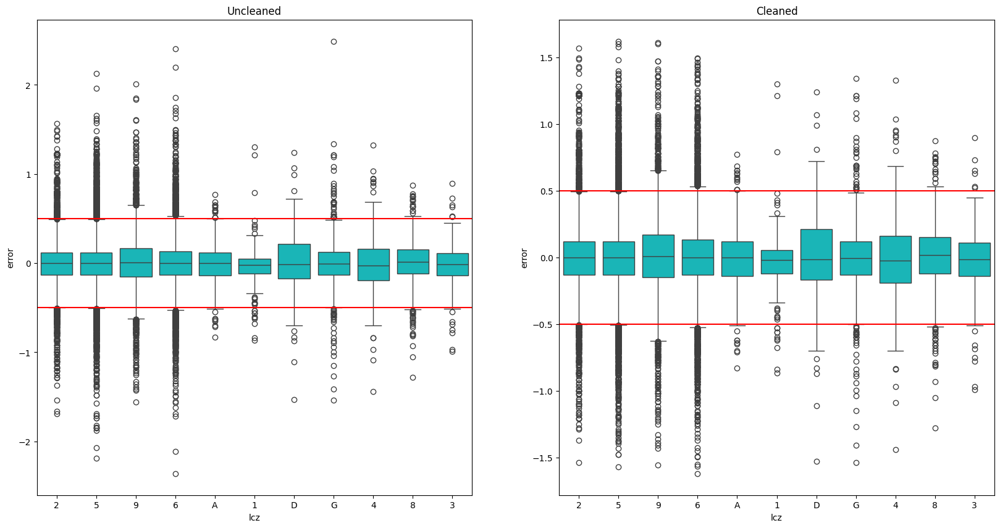

In [24]:
# Analysis of run 4
vis.run_boxplot(lcz_df, lcz_cleaned, '4')

We expect the LCZs 2, 5, 9 and 6 to exhibit the most outliers (errors > 0.5°C). We now analyse the LCZs separately to see if we can identify any patterns.

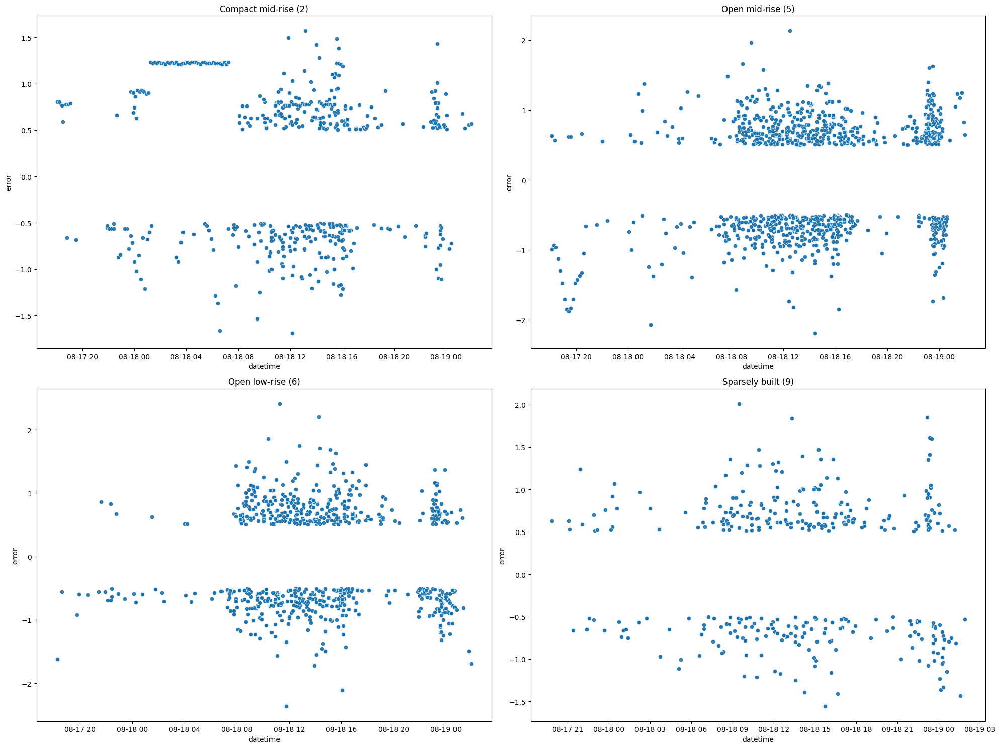

In [25]:
lczs_to_analyse = ['2', '5', '6', '9']
run_4_outliers = vis.run_lcz_scatterplot(outliers, lcz_dict, '4', lczs_to_analyse)

LCZ 2 shows the horizontal pattern previously seen - by repeating the plot with hue set to `'station'` we can attempt to identify which station is causing this.

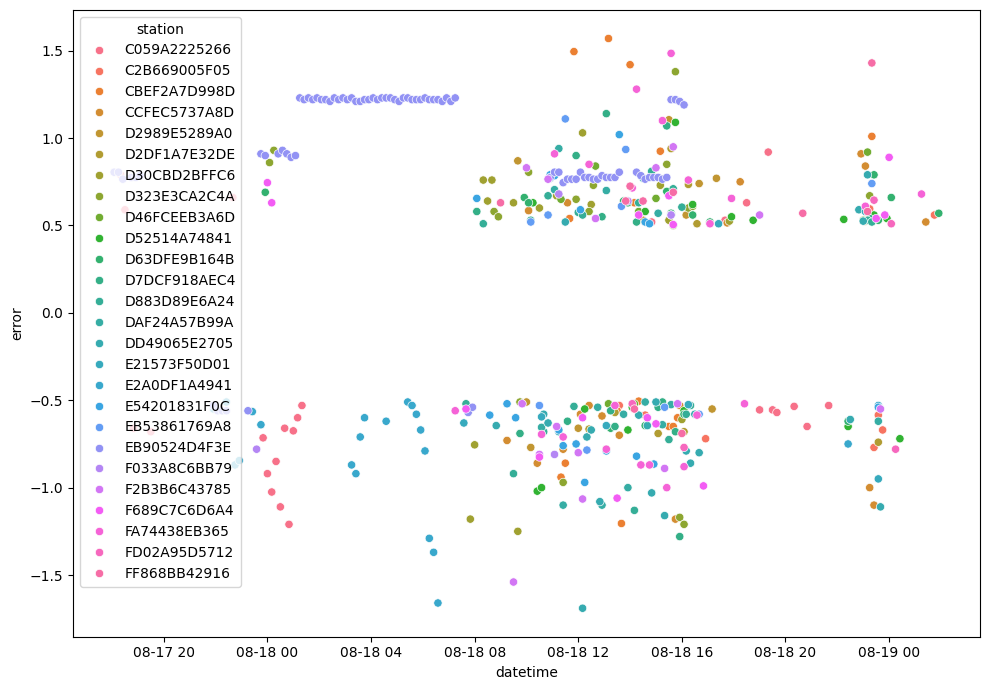

In [26]:
fig, axs = plt.subplots(figsize=(10, 7), tight_layout=True)
ax = sns.scatterplot(x='datetime', y='error', data=run_4_outliers[run_4_outliers['lcz'] == '2'], hue='station')

Out of interest we plot the error distribution for station `EB90524D4F3E` within run 4 and over all runs --> does this station perform poorly in all runs? Would indicate some systematic error.

Text(0.5, 1.0, 'Station EB90524D4F3E error distribution over run 4')

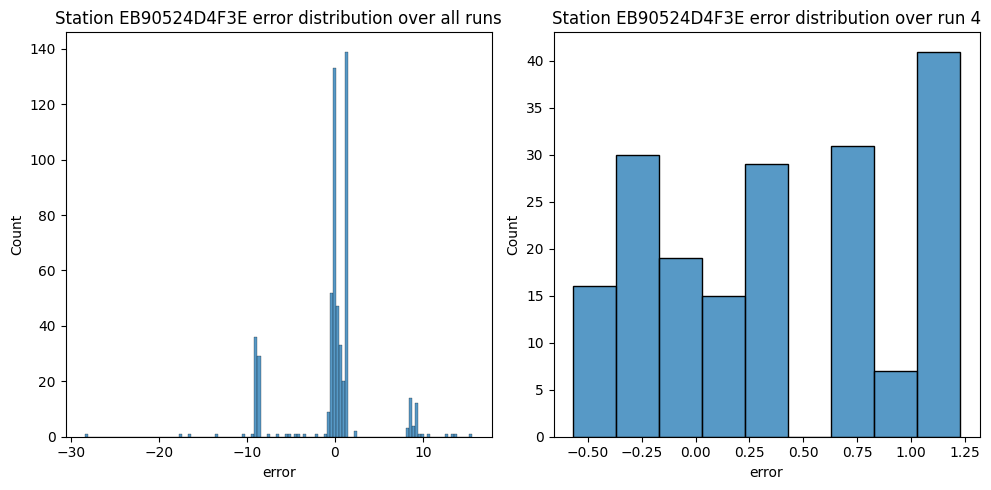

In [27]:
station_df = lcz_df[lcz_df['station'] == 'EB90524D4F3E']
station_run_4 = station_df[station_df['run'] == '4']
fig, axs = plt.subplots(1, 2, figsize=(10, 5), tight_layout=True)
ax1 = sns.histplot(x='error', data=station_df, ax=axs[0])
ax1.set_title('Station EB90524D4F3E error distribution over all runs')
ax2 = sns.histplot(x='error', data=station_run_4, ax=axs[1])
ax2.set_title('Station EB90524D4F3E error distribution over run 4')

# Run 5

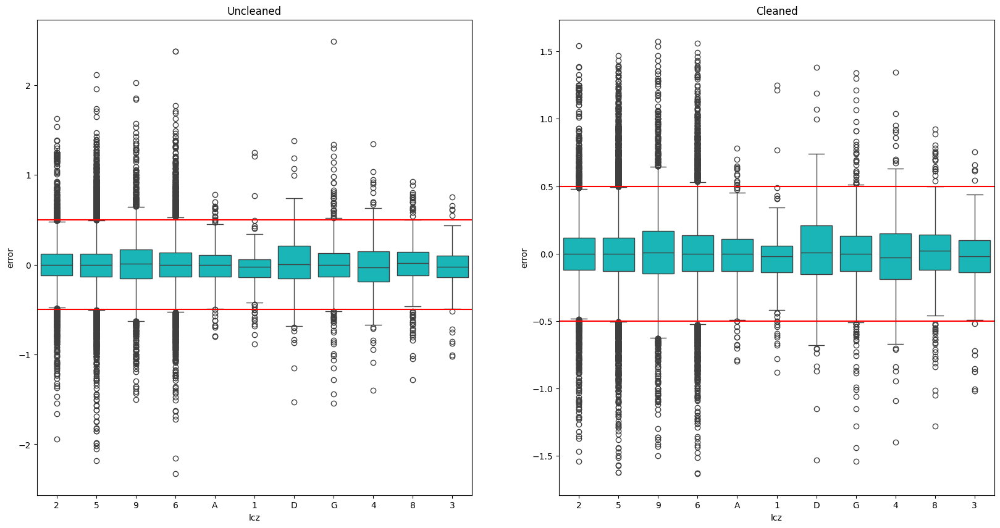

In [28]:
vis.run_boxplot(lcz_df, lcz_cleaned, '5')

Run 5 also shows no significant outliers and requires no further analysis. 

# Run Overview - Cleaned Data
Stations `F5C16A4B6340`, `F4683D808CFB` (run 2), `EB90524D4F3E` (runs 3 and 4) and `C059A2225266` (run 3) are removed from the dataset. Subsequently, the data is cleaned to 3 standard deviations, giving us the following temporal distributions:

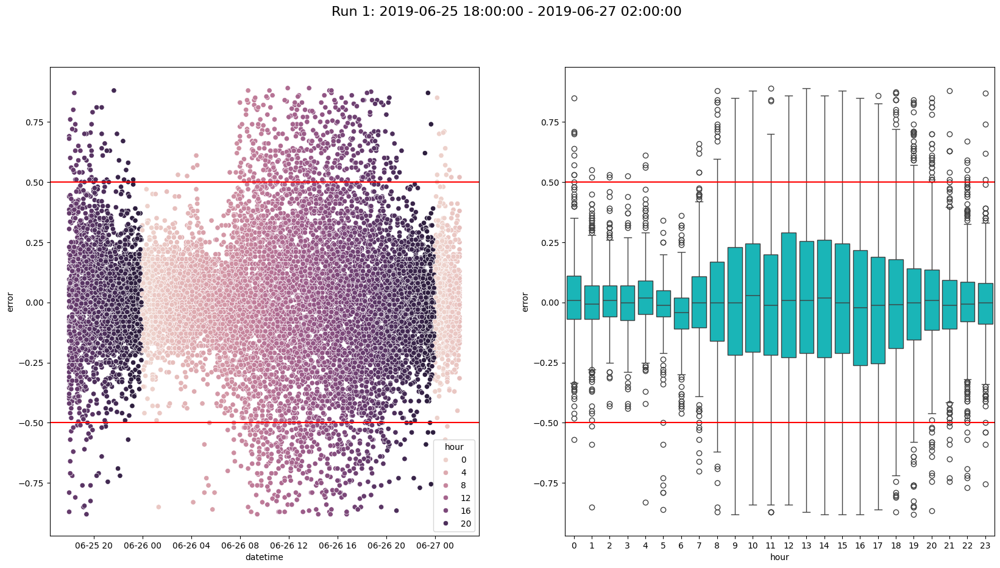

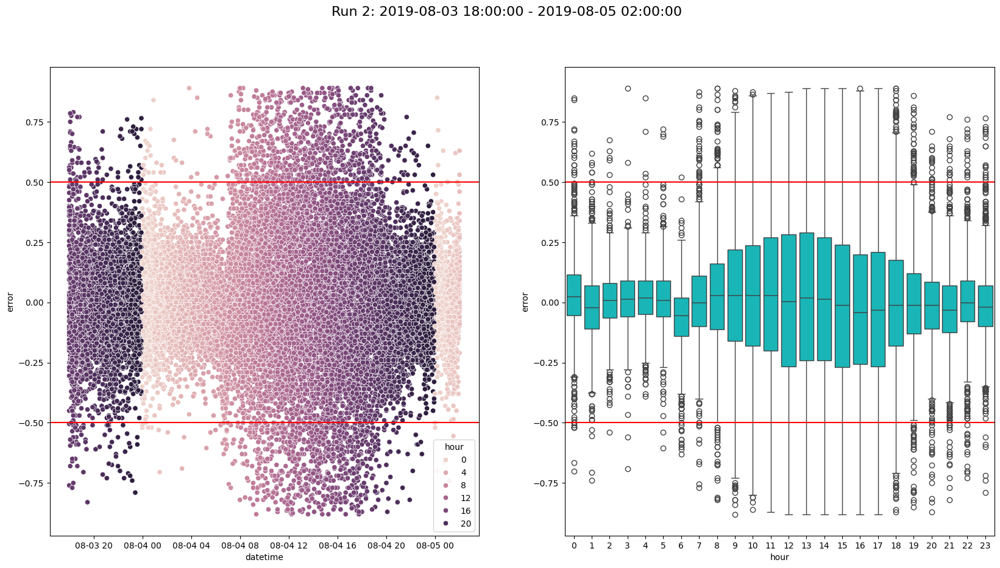

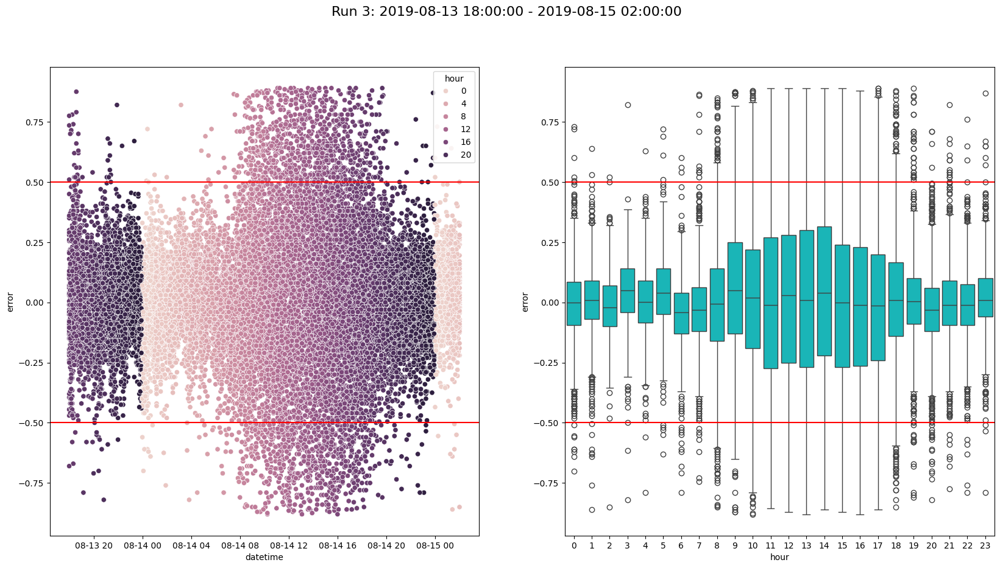

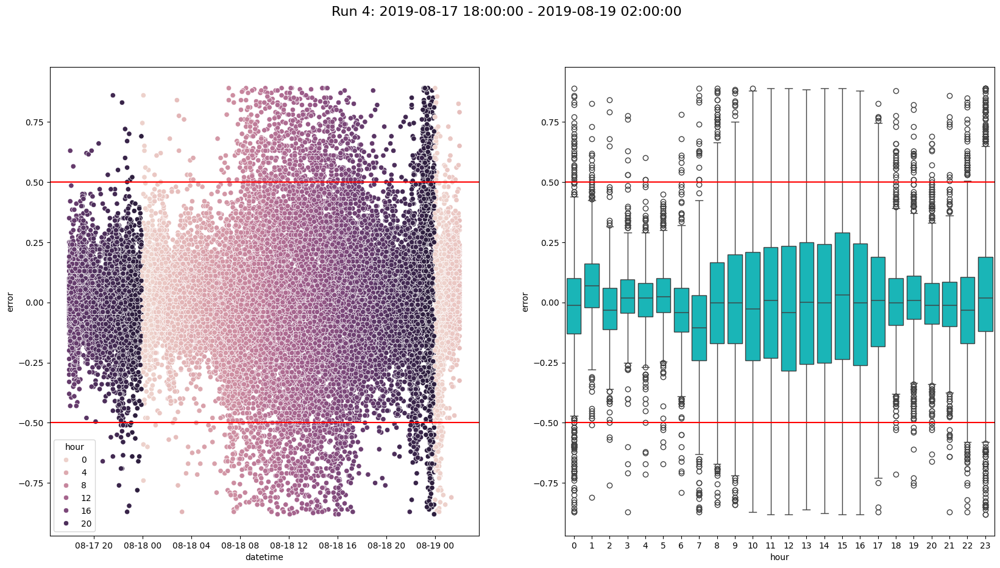

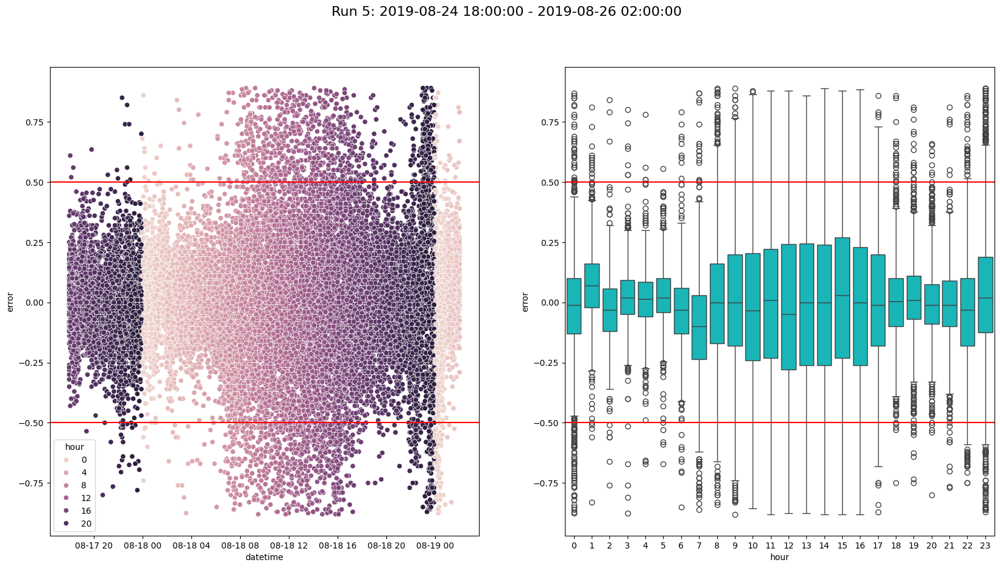

In [30]:
remove = remove = [x not in ['F5C16A4B6340', 'F4683D808CFB', 'EB90524D4F3E', 'C059A2225266'] for x in list(lcz_df['station'])]
lcz_df_removed_stations = lcz_df.iloc[remove]
lcz_df_removed_stations_cleaned, _ = qrf_utils.pop_outliers_std(lcz_df_removed_stations, 'error', 3)
vis.by_run_and_time(lcz_df_removed_stations_cleaned)

In [29]:
print('Number of outliers relative to sample size')
for lcz in lcz_dict.keys():
    sample = len(lcz_df[lcz_df["lcz"] == lcz])
    if sample != 0:
        print(f' LCZ {lcz}: {round((len(outliers[outliers["lcz"] == lcz])/sample) * 100, 2)}%')


Number of outliers relative to sample size
 LCZ A: 4.99%
 LCZ D: 12.43%
 LCZ G: 10.81%
 LCZ 1: 6.05%
 LCZ 2: 9.12%
 LCZ 3: 8.04%
 LCZ 4: 16.71%
 LCZ 5: 8.15%
 LCZ 6: 9.99%
 LCZ 8: 9.87%
 LCZ 9: 10.97%
